#### **Ονοματεπώνυμο** : Νικόλας Μπέλλος (el18183)

# 2<sup>η</sup> Εργαστηριακή Άσκηση
## Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων

<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [16]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import time
from sklearn.cluster import SpectralClustering
from tqdm import tqdm

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import os
os.chdir("/content/gdrive/MyDrive/ECE-COURSES/9-Κοινωνικά Δίκτυα/LAB-2_Data")
!ls

email-Eu-core-department-labels.txt  football.gml
email-Eu-core.txt		     got_s5.csv


## Α. Μελέτη πραγματικών τοπολογιών

<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr> 
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr> 
    
</table>

### Παραγωγή συνθετικών τοπολογιών
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

In [4]:
seedno=5  
random.seed(seedno)

In [5]:
n=80      # NODES
d=4       # DEGREE
M=300     # EDGES
R=0.25    # RADIUS
p=0.3     # PROBABILITY (for reconnection)
k=4       # NEIGHBORS

plt.figure(figsize=(40, 10))
# REG
REG = nx.watts_strogatz_graph(n, k, 0.0); REG.graph['name'] = 'REG'
# RGER
RGER = nx.gnm_random_graph(n, M); RGER.graph['name'] = 'RGER'
# RGG
RGG = nx.random_geometric_graph(n, R, 2); RGG.graph['name'] = 'RGG'
# SF
SF = nx.barabasi_albert_graph(n, d); SF.graph['name'] = 'SF'
# SW
SW = nx.watts_strogatz_graph(n, k, p); SW.graph['name'] = 'SW'


<Figure size 2880x720 with 0 Axes>

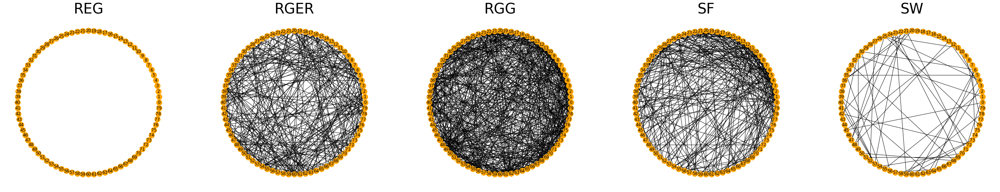

In [6]:
# GRAPHS VISUAL REPRESENTATION
plt.figure(figsize=(50, 9))

# REG
plt.subplot(151)
plt.title("REG", fontsize=40)
nx.draw_circular(REG, node_size=250, node_color="orange", with_labels=True)

# RGER
plt.subplot(152)
plt.title("RGER", fontsize=40)
nx.draw_circular(RGER, node_size=250, node_color="orange", with_labels=True)

# RGG
plt.subplot(153)
plt.title("RGG", fontsize=40)
nx.draw_circular(RGG, node_size=250, node_color="orange", with_labels=True)
# pos = nx.get_node_attributes(RGG, "pos")
# nx.draw_networkx_edges(RGG, pos, alpha=0.4)
# nx.draw_networkx_nodes(RGG, pos, node_size=250, node_color="orange")

# SF
plt.subplot(154)
plt.title("SF", fontsize=40)
nx.draw_circular(SF, node_size=250, node_color="orange", with_labels=True)

# SW
plt.subplot(155)
plt.title("SW", fontsize=40)
nx.draw_circular(SW, node_size=250, node_color="orange", with_labels=True) 


### Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.

#### **FOOTBALL**

In [7]:
#football network
football=nx.read_gml(r"football.gml"); football.graph['name'] = 'FOOTBALL'

In [8]:
print("Nodes: ", len(football.nodes()), "\nEdges: ", len(football.edges()))

Nodes:  115 
Edges:  613


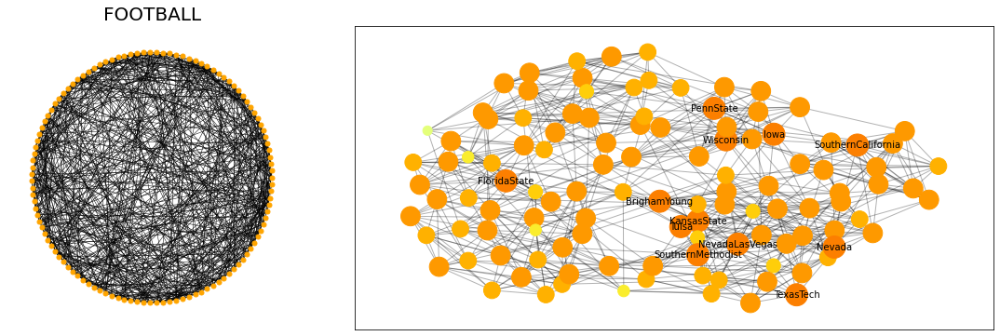

In [ ]:
# Circular graph
plt.figure(figsize=(19, 6))
plt.subplot2grid((1, 3), (0,0))
plt.title("FOOTBALL", fontsize=20)
nx.draw_circular(football, node_size=25, node_color="orange", with_labels=False, width=0.5)

# Planar graph
plt.subplot2grid((1, 3), (0,1), colspan=2)
pos = nx.kamada_kawai_layout(football)
nx.draw_networkx_edges(football, pos, alpha=0.3)

node_sizes = []
for n in football.degree():
  node_sizes.append(0.2 * n[1]**3.2)
  
nx.draw_networkx_nodes(
    football, 
    pos, 
    nodelist=[n for n in football.nodes()],
    node_size=node_sizes,
    node_color=[x[1] for x in football.degree()],
    cmap=plt.cm.Wistia,
)

labels={}
for n in football.nodes():
  if football.degree(n) > 11:
    labels[n] = str(n)
  else:
    labels[n] = ''
nx.draw_networkx_labels(football, pos, labels, font_size=10)
plt.show()


#### **GOT**

In [9]:
#Game of thrones network
import csv
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1
got.graph['name'] = 'GOT'

In [9]:
print("Nodes: ", len(got.nodes()), "\nEdges: ", len(got.edges()))

Nodes:  119 
Edges:  396


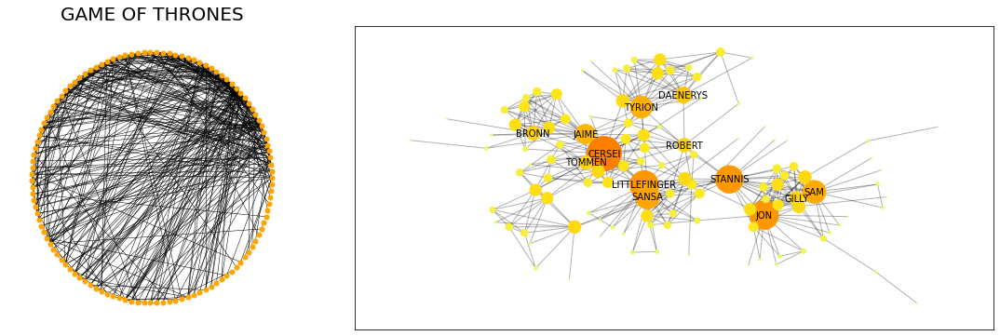

In [ ]:
# Circular graph
plt.figure(figsize=(19, 6))
plt.subplot2grid((1, 3), (0,0))
plt.title("GAME OF THRONES", fontsize=20)
nx.draw_circular(got, node_size=25, node_color="orange", with_labels=False, width=0.5)

# Planar graph
plt.subplot2grid((1, 3), (0,1), colspan=2)
pos = nx.kamada_kawai_layout(got)
nx.draw_networkx_edges(got, pos, alpha=0.3)

node_sizes = []
for n in got.degree():
  node_sizes.append(1.5 * n[1]**2)
  
nx.draw_networkx_nodes(
    got, 
    pos, 
    nodelist=[n for n in got.nodes()],
    node_size=node_sizes,
    node_color=[x[1] for x in got.degree()],
    cmap=plt.cm.Wistia,
)

labels={}
for n in got.nodes():
  if got.degree(n) > 11:
    labels[n] = str(n)
  else:
    labels[n] = ''
nx.draw_networkx_labels(got, pos, labels, font_size=10)
plt.show()

#### **EU**

Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [10]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph()); eu.graph['name'] = 'EU'
eu_copy = eu.copy()

In [11]:
# Get largest connected component
eu_largest_cc = max(nx.connected_components(eu), key=len)
eu = eu.subgraph(eu_largest_cc).copy()

In [12]:
# Remove self loops (https://stackoverflow.com/questions/49427638/removing-self-loops-from-undirected-networkx-graph)
print("Previous edges: ", len(eu.edges()))
eu.remove_edges_from(nx.selfloop_edges(eu))
print("Current edges: ", len(eu.edges()))

Previous edges:  16687
Current edges:  16064


In [15]:
print("Nodes: ", len(eu.nodes()), "\nEdges: ", len(eu.edges()))

Nodes:  986 
Edges:  16064


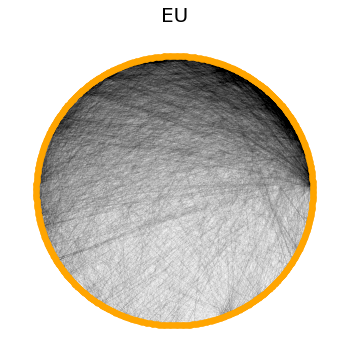

In [ ]:
# Circular graph
plt.figure(figsize=(6, 6))
plt.title("EU", fontsize=20)
nx.draw_circular(eu, node_size=25, node_color="orange", with_labels=False, width=0.01)

### Μελέτη βαθμού κόμβου (node degree) για πραγματικές και συνθετικές τοπολογίες.

In [ ]:
Synthetic_Graphs = [REG, RGER, RGG, SF, SW]
Read_Graphs = [football, got, eu]

In [16]:
def node_degree(G):
  plt.title(G.graph['name'], fontsize=30)
  degrees = [x[1] for x in G.degree()] # returns a list with all the node degrees
  plt.hist(degrees, color="orange", range=(0,30))
  plt.text(-1, 0, "Mean = %s" % str(round(np.mean(degrees), 2)), fontsize = 20, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

#### **Συνθετικές τοπολογίες**

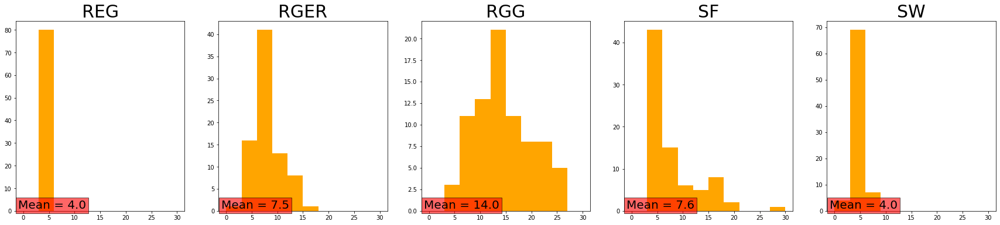

In [ ]:
plt.figure(figsize=(30, 6))

# REG
plt.subplot(151)
node_degree(REG)
# RGER
plt.subplot(152)
node_degree(RGER)
# RGG
plt.subplot(153)
node_degree(RGG)
# SF
plt.subplot(154)
node_degree(SF)
# SW
plt.subplot(155)
node_degree(SW)

plt.show()

#### **Πραγματικές τοπολογίες**

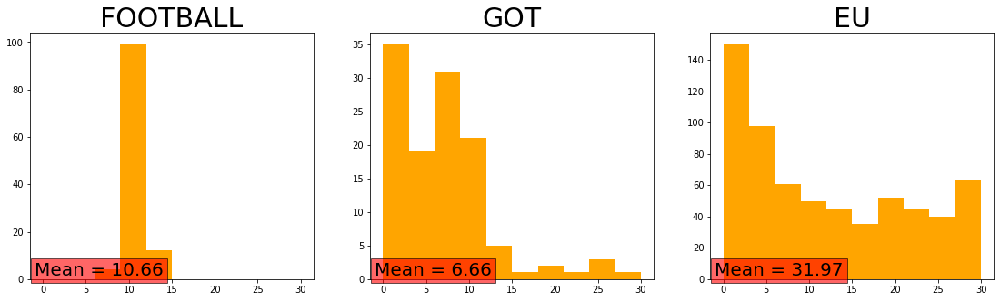

In [ ]:
plt.figure(figsize=(19, 5))

# FOOTBALL
plt.subplot(131)
node_degree(football)
# GOT
plt.subplot(132)
node_degree(got)
# EU
plt.subplot(133)
node_degree(eu)

plt.show()

### Μελέτη συντελεστή ομαδοποίησης (clustering coefficient) για πραγματικές και συνθετικές τοπολογίες

In [ ]:
def clustering_coeff(G):
  plt.title(G.graph['name'], fontsize=30)
  coefficients_dict = nx.clustering(G) # returns a dictionary with the coefficient for each node
  coefficients = [coefficients_dict.get(x) for x in coefficients_dict] # returs a list with the coefficient numbers
  plt.hist(coefficients, color="orange", range=(0,1))
  plt.text(0, 0, "Mean = %s" % str(round(np.mean(coefficients), 2)), fontsize = 20, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

#### **Συνθετικές τοπολογίες**

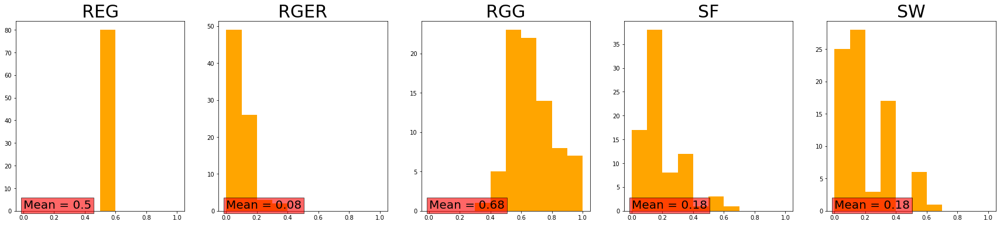

In [ ]:
plt.figure(figsize=(30, 6))

# REG
plt.subplot(151)
clustering_coeff(REG)
# RGER
plt.subplot(152)
clustering_coeff(RGER)
# RGG
plt.subplot(153)
clustering_coeff(RGG)
# SF
plt.subplot(154)
clustering_coeff(SF)
# SW
plt.subplot(155)
clustering_coeff(SW)

plt.show()

#### **Πραγματικές τοπολογίες**

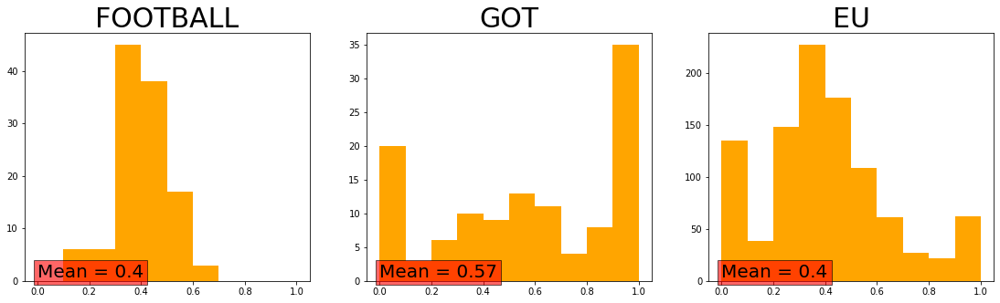

In [ ]:
plt.figure(figsize=(19, 5))

# FOOTBALL
plt.subplot(131)
clustering_coeff(football)
# GOT
plt.subplot(132)
clustering_coeff(got)
# EU
plt.subplot(133)
clustering_coeff(eu)

plt.show()

### Μελέτη κεντρικότητας εγγύτητας (closeness centrality) για πραγματικές και συνθετικές τοπολογίες.

#### **Συνθετικές τοπολογίες**

In [ ]:
def closeness_centr(G):
  plt.title(G.graph['name'], fontsize=30) 
  centralities_dict = nx.closeness_centrality(G) # returns a dictionary with the centrality for each node
  centralities = [centralities_dict.get(x) for x in centralities_dict] # returs a list with the coefficient numbers
  plt.hist(centralities, color="orange", range=(0,0.6))
  plt.text(0, 0, "Mean = %s" % str(round(np.mean(centralities), 2)), fontsize = 20, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

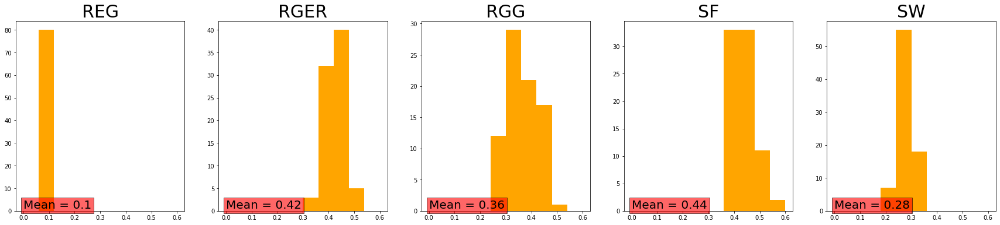

In [ ]:
plt.figure(figsize=(30, 6))

# REG
plt.subplot(151)
closeness_centr(REG)
# RGER
plt.subplot(152)
closeness_centr(RGER)
# RGG
plt.subplot(153)
closeness_centr(RGG)
# SF
plt.subplot(154)
closeness_centr(SF)
# SW
plt.subplot(155)
closeness_centr(SW)

plt.show()

#### **Πραγματικές τοπολογίες**

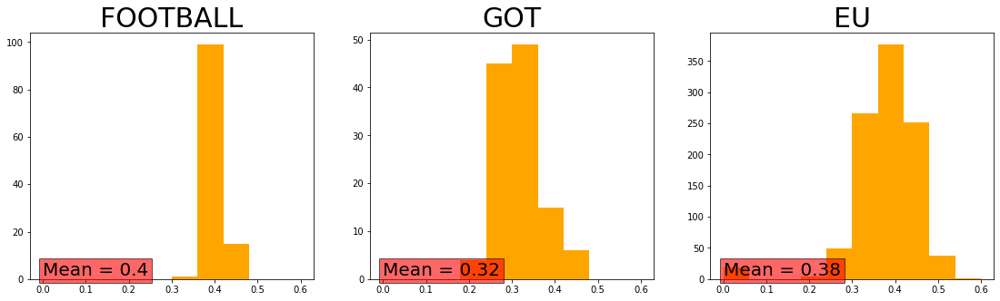

In [ ]:
plt.figure(figsize=(19, 5))

# FOOTBALL
plt.subplot(131)
closeness_centr(football)
# GOT
plt.subplot(132)
closeness_centr(got)
# EU
plt.subplot(133)
closeness_centr(eu)

plt.show()

### Συμπεράσματα
---

*Με βάση τις 3 παραπάνω μετρικές (Node degree, Clustering coefficient, Closeness centrality) αλλά και με βάση τη γραφική αναπαράσταση αυτών μπορούμε να κατατάξουμε τις 3 τοπολογίες πραγματικών δικτύων. <br>(Ακολουθεί πόρισμα για κάθε μία από τις τοπολογίες αυτές)*

#### **Football** <br>
  - Όσον αφορά τη κυκλική αναπαράσταση του γράφου, παρατηρούμε ότι ταιριάζει με τις τοπολογίες RGER και RGG, λόγω του ότι δεν παρατηρούνται κόμβοι με πολύ μεγαλύτερο βαθμό (οπως στο SF) η με σχετικά λίγες ακμές μεταξύ μακρινών κόμβων (όπως στο SW). 
  - Η κατανομή των βαθμών κόμβων παρουσιάζει ένα μέγιστο με φθήνουσα κατανομή αριστερά και δεξιά του μεγίστου, το οποίο εντοπίζεται τόσο στο RGER οσο και στο RGG. Σημειώνεται ότι δεν παρατηρείται μεγάλη διασπορά, όσο στην κατανομή του RGER λόγω του ότι όλες οι ομάδες θα έπρεπε να έχουν παίξει περίπου τον ίδιο αριθμό παιχνιδιών, άρα όσον αφορά το βαθμό κόμβου η τοπολογία αυτή ταιριάζει στην RGER. 
  - Η κατανομή του συντελεστή ομαδοποίησης ταιριάζει περισσότερο σε αυτή του RGG καθώς η μέση τιμή είναι σχετικά υψηλή και άρα παρατηρείται υψηλή συσωμάτοση στους κόμβους σε αντίθεση με τη τοπολογία RGER.
  - Η κατανομή της κεντρικότητας εγγύτητας παρουσιάζει ένα μεγάλο μέγιστο και μικρή διασπορά κάτι το οποίο συναντάμε στη τοπολογία RGER, καθώς στην RGG υπάρχει σχετικά μεγαλύτερη διασπορά.

**Παρατηρήσεις**: Η τοπολογία αυτή αποτελεί ένα γράφο όπου οι περισσότεροι κόμβοι έχουν τον ίδιο βαθμό (όπως στο REG) γιατί πρόκειται για πρωτάθλημα, όμως παράλληλα παρατηρείται μεγάλος συντελεστής ομαδοποίησης (όπως στο RGG), γιατί για κάθε ομάδα ξέρουμε ότι και οι διπλανές τις θα αγωνίζονται μεταξύ τους, ενώ τέλος, ολοι οι περισσότεροι κόμβοι έχουν την ίδια κεντρικότητα εγγύτητας (όπως στο RGER) διότι δεν υπάρχει η έννοια της γεωγραφικής απόστασης όπως στα RGG, αλλά η έννοια της απόστασης 2 ομάδων μεταξύ τους, η οποία δεν θα πρέπει να ειναι μεγάλη ώστε να παίζουν όλες με όλες.

**Πόρισμα**: Η τοπολογία αυτή είναι **RGER** με χαρακτηριστικά από το RGG, όπως ο μεγάλος συντελεστής ομαδοποίησης. (Θα μπορούσαμε ακόμη να πούμε ότι παρατηρούμε και χαρακτηριστικά από τον REG, διότι κάθε κόμβος έχει τον ίδιο περίπου βαθμό)


#### **Game of thrones** <br>
  - Όσον αφορά τη κυκλική αναπαράσταση του γράφου, παρατηρούμε ότι ταιριάζει με τη τοπολογία SF διότι παρατηρούνται ορισμένοι κόμβοι με μεγάλο βαθμό.
  - Η κατανομή του βαθμού κόμβου είναι φθήνουσα, κάτι το οποίο παρατηρείται μόνο στη τοπολογία του SF γράφου.
  - Η μέση τιμή του συντελεστή ομαδοποίησης είναι σχετικά μεγάλος για SF και ταιριάζει περισσότερο σε RGG τοπολογία, καθώς γνωρίζουμε ότι στο συγκεκριμένο γράφο υπάχρουν πραγματικές κοινότητες.
  - Η κατανομή της κεντρικότητας εγγύτητας ταιριάζει περισσότερο σε αυτή της SF τοπολογίας, διότι παρατηρούνται λίγοι κόμβοι με μεγάλη κεντρικότητα, ενώ η πλειοψηφία παρατηρείται να έχει μικρότερη κεντρικότητα.

**Παρατηρήσεις**: Η τοπολογία αυτή αποτελεί ένα γράφο όπου δημιουργούνται κοινότητες (όπως στον RGG) αλλά ταυτόχρονα υπάρχουν και κάποιοι κόμβοι με μεγάλη κεντρικότητα και βαθμό το οποίο είναι χαρακτηριστικό της SF τοπολογίας, και διαιολογείται από την ύπαρξη πρωταγονιστών στη σειρά GoT. (Λόγω της φυσικής απόστασης μεταξύ των κοινωτήτων στο πραγματικό κόσμο μπορούμε να εντάξουμε την έννοια της γεωγραφικής απόστασης στο γράφο μας, όπως στον RGG).

**Πόρισμα**: Η τοπολογία αυτή είναι **SF** με χαρακτηρηρστικά από το RGG, όπως ο μεγάλος συντελεστής ομαδοποίησης.


#### **EU emails** <br>
  - Όσον αφορά τη κυκλική αναπαράσταση του γράφου, παρατηρούμε ότι ταιριάζει με τη τοπολογία SF διότι παρατηρούνται ορισμένοι κόμβοι με μεγάλο βαθμό.
  - Η κατανομή του βαθμού κόμβου είναι φθήνουσα, κάτι το οποίο παρατηρείται μόνο στη τοπολογία του SF γράφου.
  - Η μέση τιμή του συντελεστή ομαδοποίησης είναι λίγο μεγαλύτερη από αυτή του SF γράφου, όμως παρατηρούμε ότι υπάρχουν πολλοί κόμβοι με μικρό συντελεστή, κάτι το οποίο δεν συναντάμε τόσο στον RGG.
  - Η κατανομή της κεντρικότητας εγγύτητας ταιριάζει περισσότερο σε αυτή της SF τοπολογίας, διότι παρατηρούνται λίγοι κόμβοι με μεγάλη κεντρικότητα, ενώ η πλειοψηφία παρατηρείται να έχει μικρότερη κεντρικότητα.

**Παρατηρήσεις**: Η τοπολογιά αυτή φαίνεται να αποτελεί ένα γράφο με λίγους κεντρικούς κόμβους στους οποίους στέλνουν όλοι emails, ενώ παράλληλα μπορεί να εντοπιστεί η δημιουργία ομαδοποιήσεων των κόμβων, χωρίς απαραίτητα να δικαιολογείται αυτό από την γεωγραφική απόσταση των κόμβων. Οι ομάδες αυτές μπορεί να δημιουργούνται από τμήματα μέσα στον οργανισμό.

**Πόρισμα**: Η τοπολογία αυτή είναι **SF**, με σχετικά υψηλό συντελεστή ομαδοποίησης.

## B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων

<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [13]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικ΄ές τοπολογίες σε integers
def conv2int(G,start_value=0):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

In [14]:
def colors2partition(G_colors, G_dict): # G_colors: list, G_dict: dictionary (0: 'node-0 name', 1: 'node-1 name', ...)
  partitions = []
  for i, color in enumerate(G_colors): # colors are integers (0, 1, ...)
    if (color+1 > len(partitions)):
      partitions.append({G_dict.get(i)})
    else:
      partitions[color].add(G_dict.get(i))

  return partitions

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [15]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())
print(colors)

['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'aliceblue', 'antiquewhite', 'aqua', 'aquamarine', 'azure', 'beige', 'bisque', 'black', 'blanchedalmond', 'blue', 'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 'cornflowerblue', 'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkorchid', 'darkred', 'darksalmon', 'darkseagreen', 'darkslateblue', 'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro', 'ghostwhite', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory', 'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow', 'lightgray', 'lightgreen', 'lightgrey', 'ligh

### Newman-Girvan 
(Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan).

- Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.
- Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.

In [15]:
import itertools as itools

def newman_girvan(G, metric=nx.algorithms.community.modularity): 
  # https://networkx.org/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html
  n_communities = 50
  best_partition=None; best_partition_n=None; best_score=0
  iterations = nx.algorithms.community.centrality.girvan_newman(G) # Tuples of sets of nodes. Each tuple is an iteration in the existing communities
  partitions = itools.takewhile(lambda i: len(i) <= n_communities, iterations) # returns all the iterations until n communities have been formed
  for partition in tqdm(partitions):
    partition_score = metric(G, list(partition))
    if (type(partition_score) is tuple): # in case of 'partition_quality' metric
      partition_score = partition_score[1]
    if (partition_score > best_score): 
      best_partition = partition; best_partition_n = len(partition); best_score = partition_score

  print("Communities: ", best_partition_n, ", Metric Score: ", best_score)
  plt.text(-1.15, -1, "Communities: %d \nScore: %f" % (best_partition_n, best_score), fontsize = 15, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

  return len(best_partition), best_partition # returns (n: number of partitions, partitions: tuple of partitions)

In [31]:
# Create list of node colors based on partition
def colors_newman_girvan(G, metric=nx.algorithms.community.modularity):
  colors_list = np.zeros(len(G.nodes())) # Initialize the colors list
  nodes_list = list(G.nodes())
  
  n_nodes, partitions_G = newman_girvan(G, metric) # Calculate the partitions
  partition_no = 0
  for partition in partitions_G:
    for node in partition:
      colors_list[nodes_list.index(node)] = partition_no
    partition_no+=1
  return colors_list

### Spectral Clustering
(Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering).

Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
- Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,50 Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [33]:
def spectral_clustering(G, metric=nx.algorithms.community.modularity):
  # https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html
  G_new, G_dict = conv2int(G) # convert string nodes to integers
  adj_matrix = np.asarray(nx.to_numpy_matrix(G_new)) # calculate the adjacency matrix

  n_communities_list = list(range(2, 51)) # list for number of communities
  best_partition=None; best_partition_n=None; best_score=0
  for n_communities in tqdm(n_communities_list):
    clustering = SpectralClustering(
        n_clusters = n_communities,
        assign_labels='discretize',
        affinity='precomputed',
        random_state=0
    )
    communities = clustering.fit_predict(adj_matrix) # list of node colors ([0, 0, 1, 1, 1, 0, 2, ...])

    partition = colors2partition(communities, G_dict) # turn colors to partition (list of sets)
    partition_score = metric(G, list(partition))
    if (type(partition_score) is tuple): # in case of 'partition_quality' metric
      partition_score = partition_score[1]
    if (partition_score > best_score): 
      best_partition = communities; best_partition_n = n_communities; best_score = partition_score

  print("Communities: ", best_partition_n, ", Metric Score: ", best_score)
  plt.text(-1.15, -1, "Communities: %d \nScore: %f" % (best_partition_n, best_score), fontsize = 15, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

  return best_partition # returns a list with the number of community for each node

### Modularity Maximization
(Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization).
- Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [26]:
def modularity_maximization(G):
  # https://networkx.org/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html
  start_time = time.time()
  communities = nx.algorithms.community.greedy_modularity_communities(G)
  print("--- %s seconds ---" % (time.time() - start_time))
  print("Communities: ", len(communities), ", Modularity : ", nx.algorithms.community.modularity(G, communities), ", Performance : ", nx.algorithms.community.partition_quality(G, communities)[1])
  plt.text(-1.15, -1, "Communities: %d \nScore: %f" % (len(communities), nx.algorithms.community.modularity(G, communities)), fontsize = 15, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')

  return communities

In [18]:
def colors_modularity_maximization(G):
  partitions_G = modularity_maximization(G)
  colors_list = np.zeros(len(G.nodes())) # Initialize the colors list
  nodes_list = list(G.nodes())

  partition_no = 0
  for partition in partitions_G:
      for node in partition:
        colors_list[nodes_list.index(node)] = partition_no
      partition_no+=1

  return colors_list

### **PLOTING FUNCTIONS**

In [20]:
import warnings
warnings.filterwarnings('ignore')

In [22]:
# NEWMAN-GIRVAN - Planar graph
def draw_newman_girvan(title, G, metric, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
  
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=colors_newman_girvan(G, metric),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

In [34]:
# SPECTRAL CLUSTERING - Planar graph
def draw_spectral_clustering(title, G, metric, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
    
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=spectral_clustering(G, metric),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

In [21]:
# MODULARITY MAXIMIZATION - Planar graph
def draw_modularity_maximization(title, G, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
    
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=colors_modularity_maximization(G),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

### Οπτικοποίηση κοινοτήτων **American College Football**

**NEWMAN-GIRVAN**

49it [00:06,  7.06it/s]


Communities:  10 , Metric Score:  0.5996290274077957


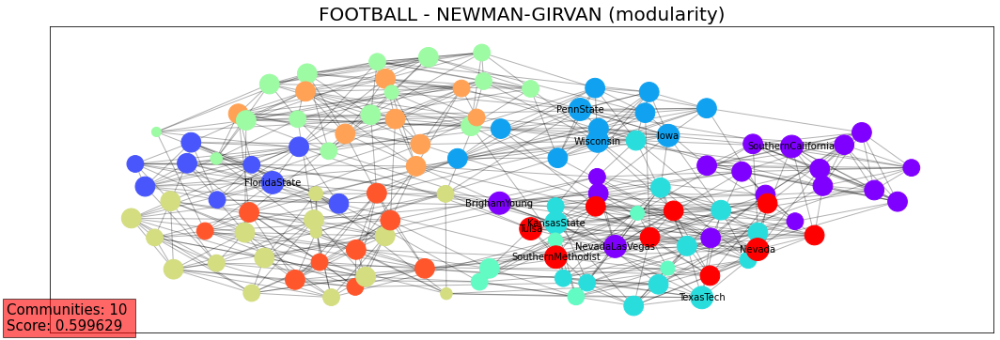

49it [00:06,  7.52it/s]


Communities:  17 , Metric Score:  0.9581998474446987


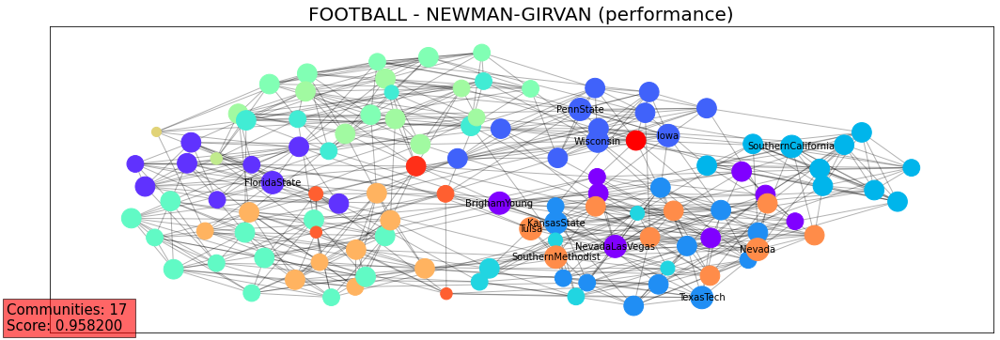

In [42]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("FOOTBALL - NEWMAN-GIRVAN (modularity)", football, nx.algorithms.community.modularity, 0.2, 3.2)
draw_newman_girvan("FOOTBALL - NEWMAN-GIRVAN (performance)", football, nx.algorithms.community.partition_quality, 0.2, 3.2)

**SPECTRAL CLUSTERING**

100%|██████████| 49/49 [00:01<00:00, 29.99it/s]


Communities:  9 , Metric Score:  0.5740521437372428


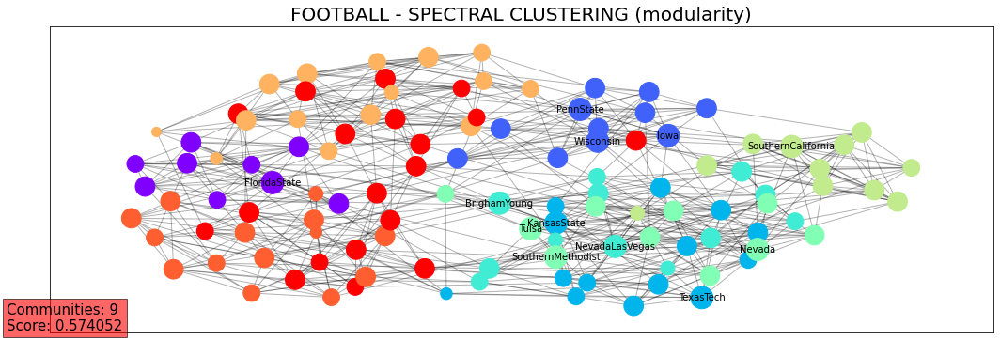

100%|██████████| 49/49 [00:01<00:00, 28.01it/s]


Communities:  14 , Metric Score:  0.9411136536994661


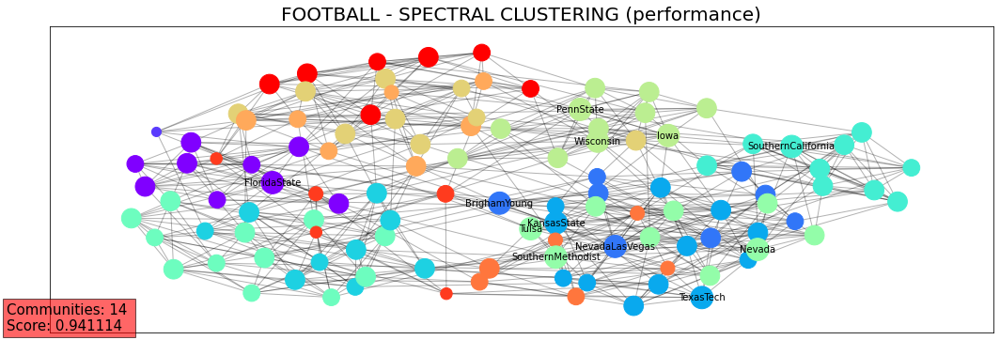

In [37]:
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("FOOTBALL - SPECTRAL CLUSTERING (modularity)", football, nx.algorithms.community.modularity, 0.2, 3.2)
draw_spectral_clustering("FOOTBALL - SPECTRAL CLUSTERING (performance)", football, nx.algorithms.community.partition_quality, 0.2, 3.2)

**MODULARITY MAXIMIZATION**

--- 0.14170360565185547 seconds ---
Communities:  6 , Modularity :  0.5564043335134086 , Performance :  0.8684973302822273


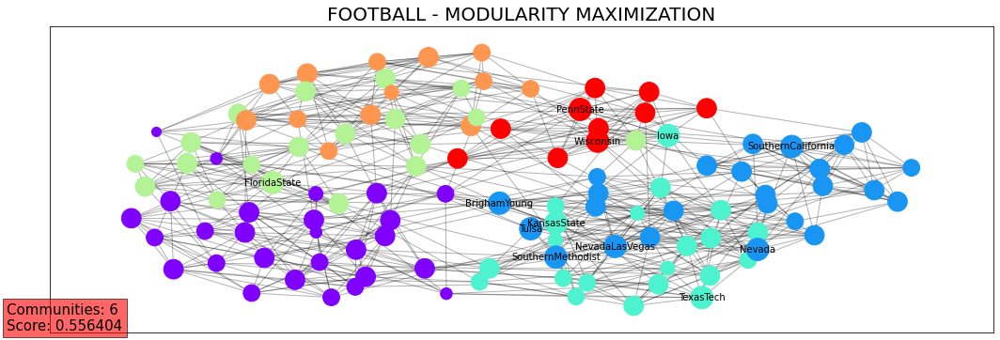

In [27]:
# MODULARITY MAXIMIZATION
draw_modularity_maximization("FOOTBALL - MODULARITY MAXIMIZATION", football, 0.2, 3.2)

### Οπτικοποίηση κοινοτήτων **Game of Thrones**

**NEWMAN-GIRVAN**

49it [00:02, 18.78it/s]


Communities:  8 , Metric Score:  0.6681205999387817


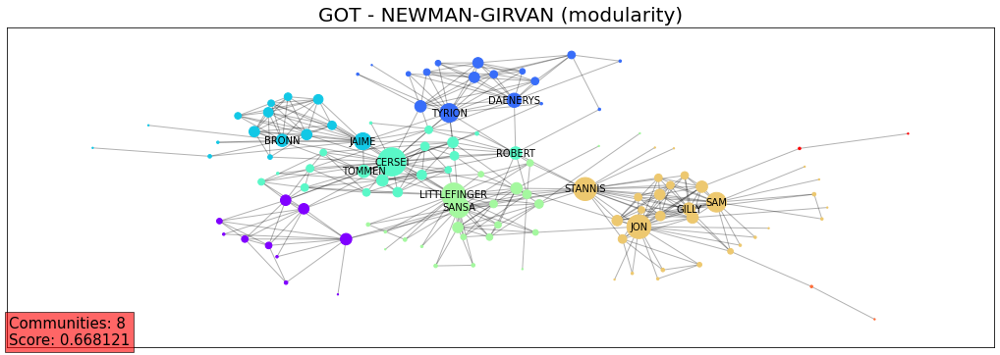

49it [00:02, 16.84it/s]


Communities:  50 , Metric Score:  0.96425010682239


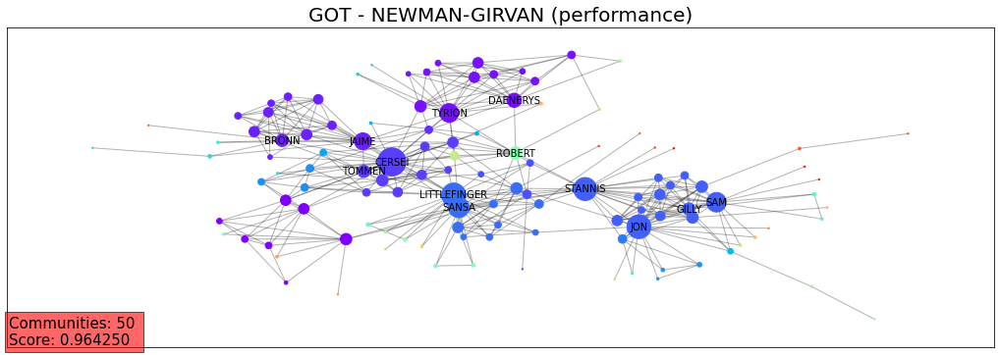

In [43]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("GOT - NEWMAN-GIRVAN (modularity)", got, nx.algorithms.community.modularity, 1.8, 1.8)
draw_newman_girvan("GOT - NEWMAN-GIRVAN (performance)", got, nx.algorithms.community.partition_quality, 1.8, 1.8)

**SPECTRAL CLUSTERING**

100%|██████████| 49/49 [00:01<00:00, 33.69it/s]


Communities:  7 , Metric Score:  0.584191026425875


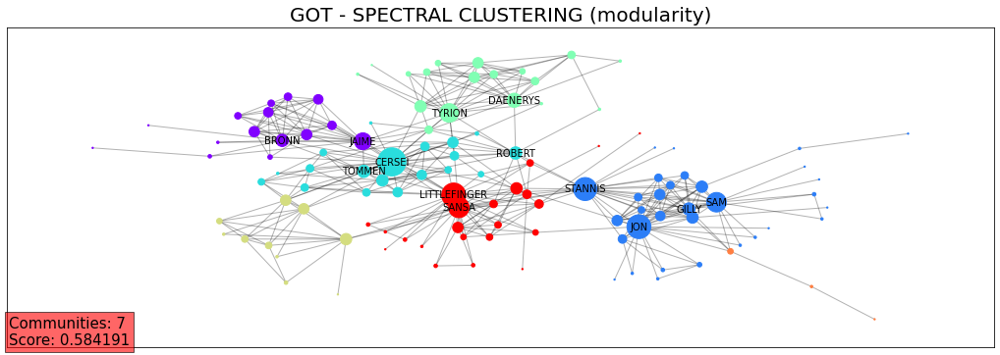

100%|██████████| 49/49 [00:01<00:00, 33.21it/s]


Communities:  36 , Metric Score:  0.9417461900014243


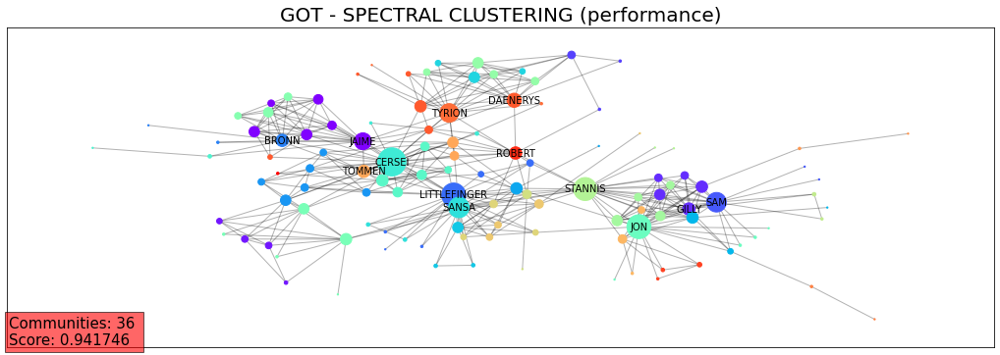

In [38]:
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("GOT - SPECTRAL CLUSTERING (modularity)", got, nx.algorithms.community.modularity, 1.8, 1.8)
draw_spectral_clustering("GOT - SPECTRAL CLUSTERING (performance)", got, nx.algorithms.community.partition_quality, 1.8, 1.8)

**MODULARITY MAXIMIZATION**

--- 0.0567326545715332 seconds ---
Communities:  5 , Modularity :  0.660477884909703 , Performance :  0.829796325309785


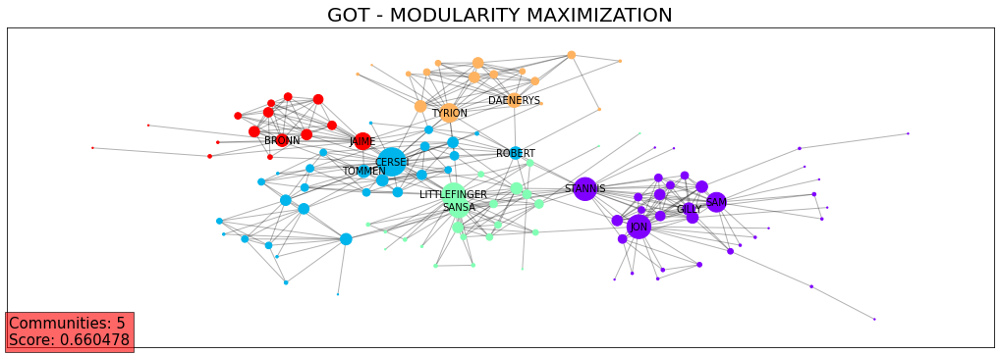

In [28]:
# MODULARITY MAXIMIZATION
draw_modularity_maximization("GOT - MODULARITY MAXIMIZATION", got, 1.8, 1.8)

### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

In [24]:
# Position object for the EU graph
pos_eu = nx.kamada_kawai_layout(eu)

**NEWMAN-GIRVAN**

49it [10:37, 13.00s/it]


Communities:  2 , Metric Score:  0.0006218821799455388


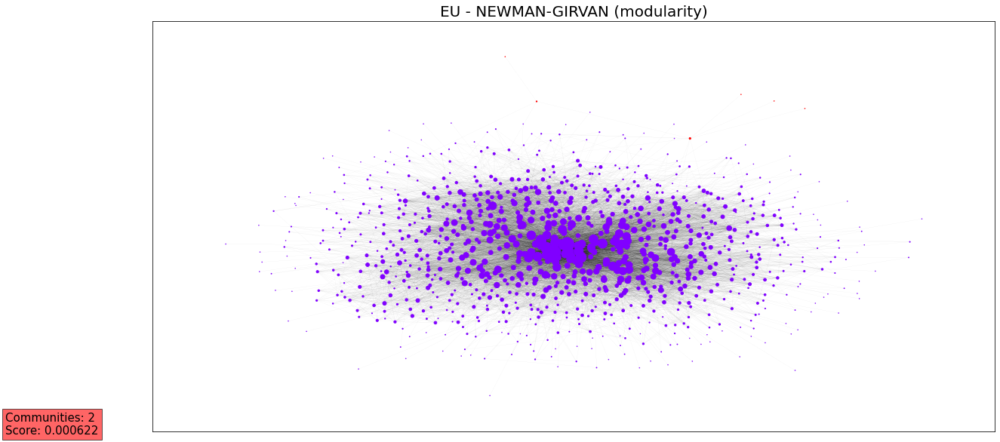

49it [10:37, 13.01s/it]


Communities:  50 , Metric Score:  0.13940548388093205


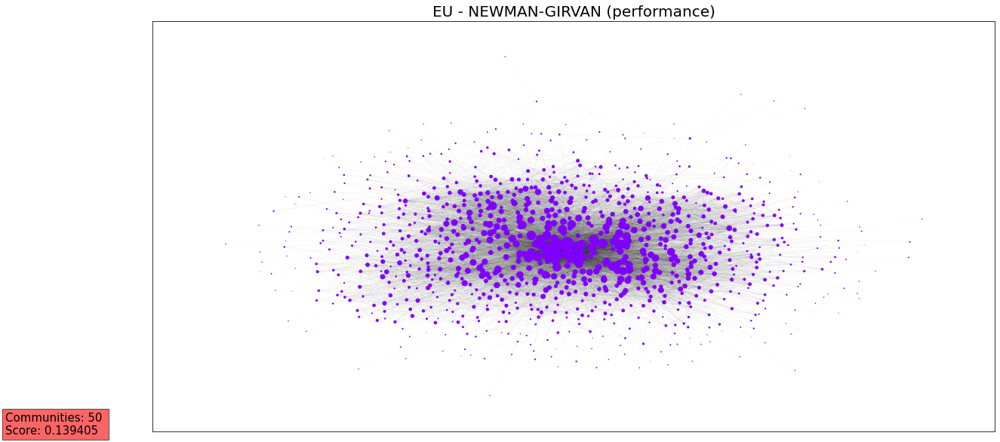

In [44]:
# NEWMAN-GIRVAN (modularity, performance)
plt.figure(figsize=(20, 10))
plt.title("EU - NEWMAN-GIRVAN (modularity)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_newman_girvan(eu, nx.algorithms.community.modularity),
    cmap=plt.cm.rainbow,
)
plt.show()
#-------------------------
plt.figure(figsize=(20, 10))
plt.title("EU - NEWMAN-GIRVAN (performance)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_newman_girvan(eu, nx.algorithms.community.partition_quality),
    cmap=plt.cm.rainbow,
)
plt.show()

**SPECTRAL CLUSTERING**

100%|██████████| 49/49 [00:15<00:00,  3.16it/s]


Communities:  8 , Metric Score:  0.38512835795761174


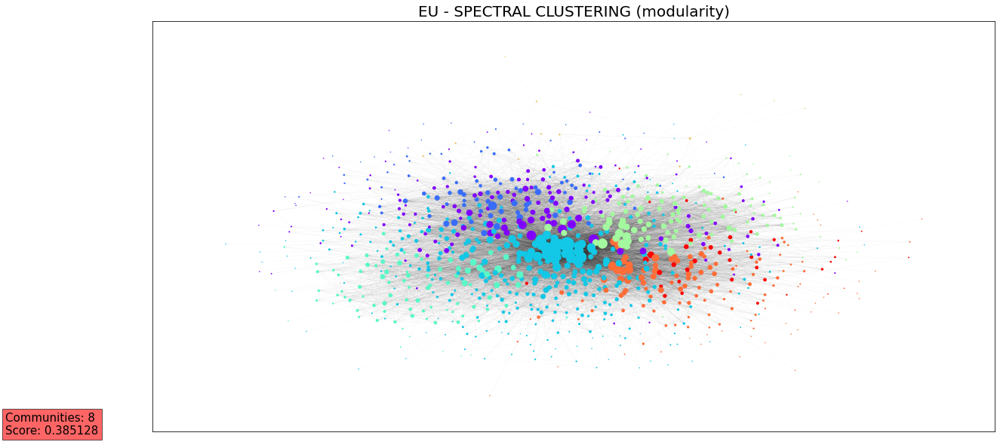

100%|██████████| 49/49 [00:14<00:00,  3.40it/s]


Communities:  48 , Metric Score:  0.9538966855777844


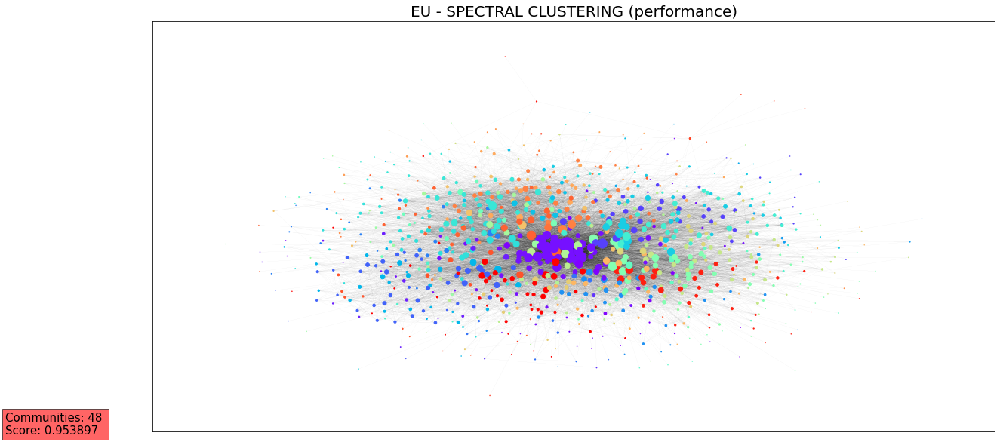

In [45]:
# SPECTRAL CLUSTERING (modularity, performance)
# draw_spectral_clustering("EU - SPECTRAL CLUSTERING (modularity)", eu, nx.algorithms.community.modularity, 0.2, 1)
# draw_spectral_clustering("EU - SPECTRAL CLUSTERING (performance)", eu, nx.algorithms.community.partition_quality, 0.2, 1)
plt.figure(figsize=(20, 10))
plt.title("EU - SPECTRAL CLUSTERING (modularity)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=spectral_clustering(eu, nx.algorithms.community.modularity),
    cmap=plt.cm.rainbow,
)
plt.show()
#-------------------------
plt.figure(figsize=(20, 10))
plt.title("EU - SPECTRAL CLUSTERING (performance)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=spectral_clustering(eu, nx.algorithms.community.partition_quality),
    cmap=plt.cm.rainbow,
)
plt.show()

**MODULARITY MAXIMIZATION**

--- 4.6082682609558105 seconds ---
Communities:  8 , Modularity :  0.3471325650460906 , Performance :  0.7078716240565892


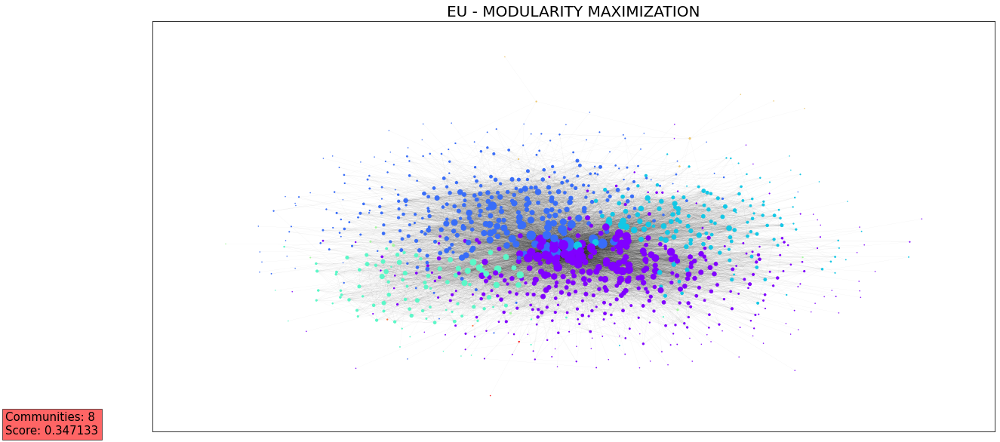

In [29]:
# MODULARITY MAXIMIZATION
plt.figure(figsize=(20, 10))
plt.title("EU - MODULARITY MAXIMIZATION", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)
  
nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_modularity_maximization(eu),
    cmap=plt.cm.rainbow,
)

plt.show()

**GROUND-TRUTH PARTITION**

In [47]:
#email-Eu-core pertitioned
eu_labeled_colors = []
with open('email-Eu-core-department-labels.txt') as txt_file:
  for line in txt_file.readlines():
    node = line.split() # [node_no, cluster_no]
    eu_labeled_colors.append(int(node[1]))
    
eu_copy_int, eu_copy_dict = conv2int(eu_copy) # dictionary of eu graph {node_no: node_name}
eu_labeled_partition = colors2partition(eu_labeled_colors, eu_copy_dict) # partition from txt file

print("GROUND-TRUTH PARTITIONING")
print("Clusters: ", len(eu_labeled_partition) 
    , "\nModularity: ", nx.algorithms.community.modularity(eu_copy, eu_labeled_partition)
    , "\nPerformance: ", nx.algorithms.community.partition_quality(eu_copy, eu_labeled_partition)[1])

GROUND-TRUTH PARTITIONING
Clusters:  42 
Modularity:  0.2898006006913114 
Performance:  0.9427325523775545


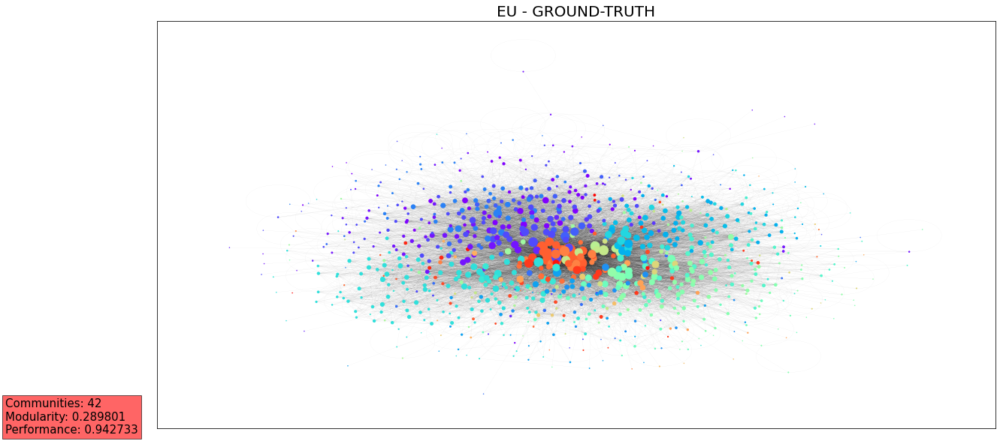

In [48]:
# GROUND-TRUTH (planar graph)
plt.figure(figsize=(20, 10))
plt.title("EU - GROUND-TRUTH", fontsize=20)
pos_eu_copy = nx.kamada_kawai_layout(eu_copy)
nx.draw_networkx_edges(eu_copy, pos_eu_copy, width=0.05, alpha=0.3)

node_sizes = []
for n in eu_copy.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu_copy, 
    pos_eu_copy, 
    nodelist=[n for n in eu_copy.nodes()],
    node_size=node_sizes,
    node_color=eu_labeled_colors,
    cmap=plt.cm.rainbow,
)
plt.text(-1.15, -1, "Communities: %d \nModularity: %f \nPerformance: %f" % (len(eu_labeled_partition), nx.algorithms.community.modularity(eu_copy, eu_labeled_partition), nx.algorithms.community.partition_quality(eu_copy, eu_labeled_partition)[1]), fontsize = 15, bbox = dict(facecolor = 'red', alpha = 0.6), verticalalignment='bottom')
plt.show()

### Οπτικοποίηση κοινοτήτων REG

49it [00:00, 104.15it/s]


Communities:  8 , Metric Score:  0.7249999999999999


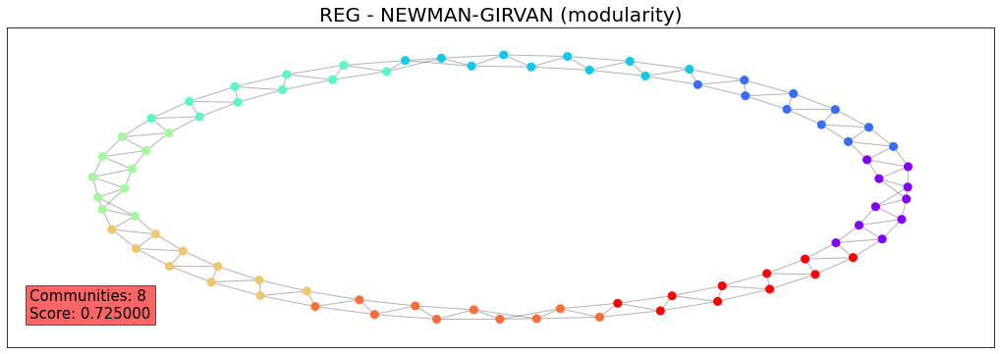

49it [00:00, 102.30it/s]


Communities:  16 , Metric Score:  0.9696202531645569


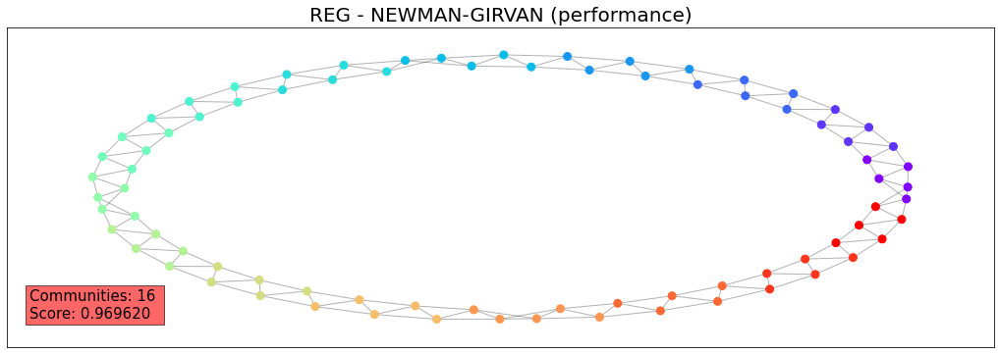

100%|██████████| 49/49 [00:00<00:00, 69.17it/s]


Communities:  6 , Metric Score:  0.6953125


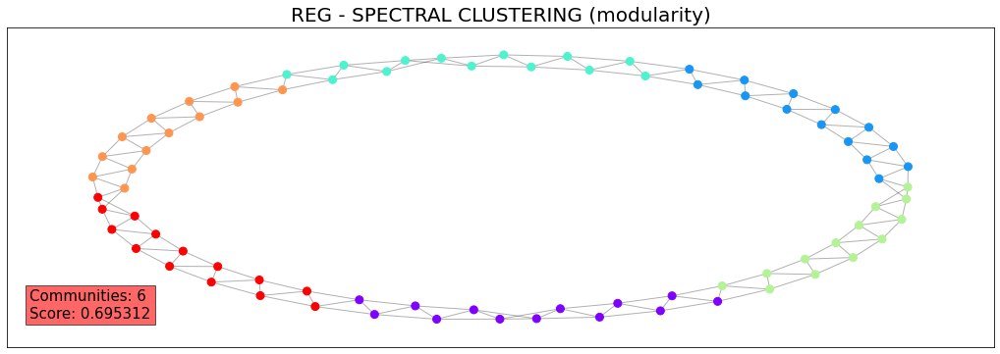

100%|██████████| 49/49 [00:00<00:00, 68.42it/s]


Communities:  19 , Metric Score:  0.9534810126582278


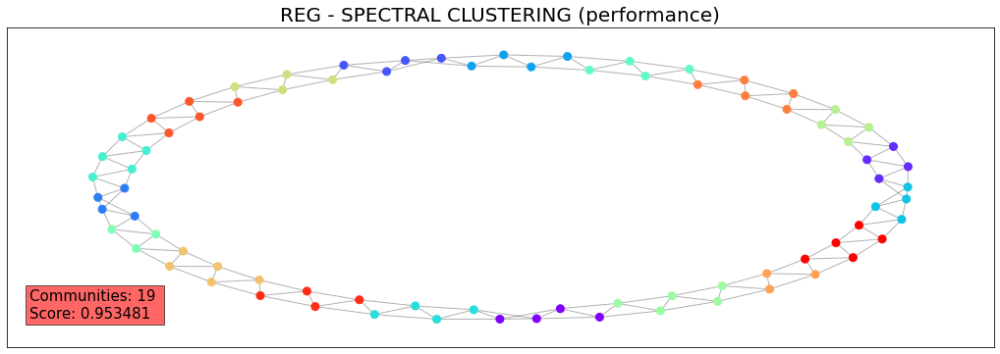

Communities:  4 , Metric Score:  0.673125


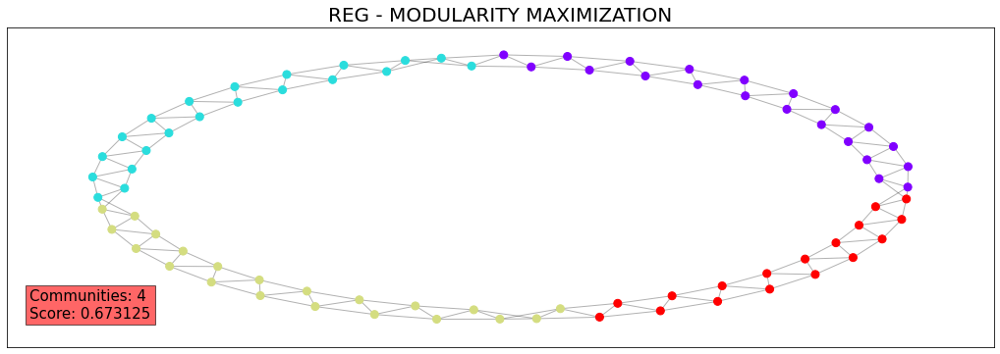

In [50]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("REG - NEWMAN-GIRVAN (modularity)", REG, nx.algorithms.community.modularity, 2, 2.5)
draw_newman_girvan("REG - NEWMAN-GIRVAN (performance)", REG, nx.algorithms.community.partition_quality, 2, 2.5)
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("REG - SPECTRAL CLUSTERING (modularity)", REG, nx.algorithms.community.modularity, 2, 2.5)
draw_spectral_clustering("REG - SPECTRAL CLUSTERING (performance)", REG, nx.algorithms.community.partition_quality, 2, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("REG - MODULARITY MAXIMIZATION", REG, 2, 2.5)

### Οπτικοποίηση κοινοτήτων RGER

49it [00:02, 18.39it/s]


Communities:  25 , Metric Score:  0.2237111111111111


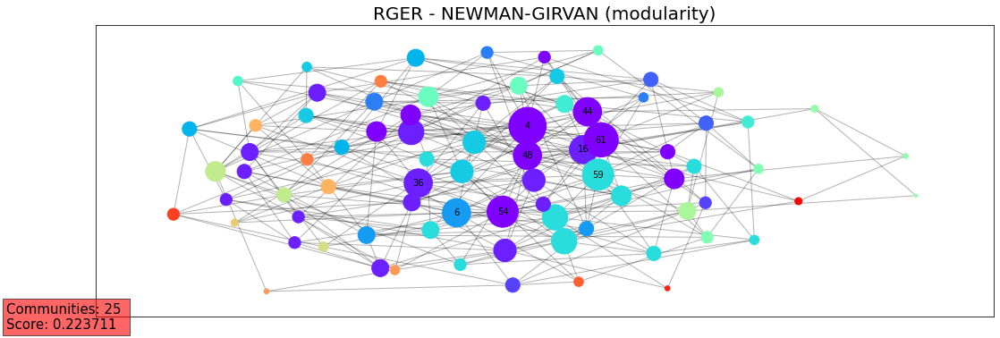

49it [00:02, 16.61it/s]


Communities:  33 , Metric Score:  0.9221518987341772


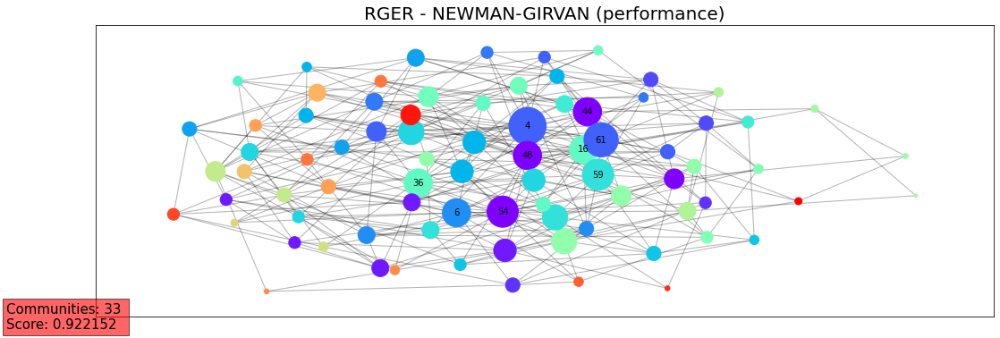

100%|██████████| 49/49 [00:00<00:00, 62.05it/s]


Communities:  6 , Metric Score:  0.2637944444444445


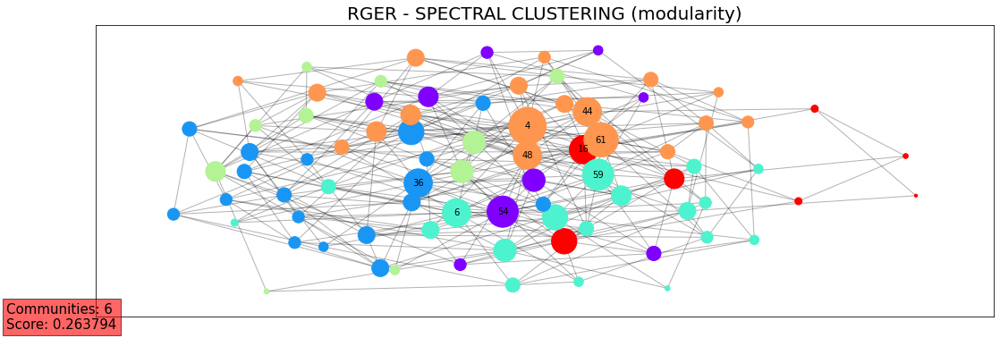

100%|██████████| 49/49 [00:00<00:00, 65.54it/s]


Communities:  27 , Metric Score:  0.9018987341772152


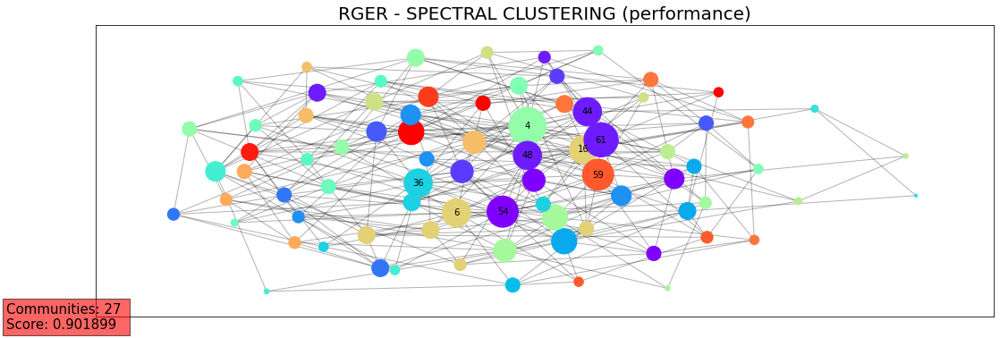

Communities:  6 , Metric Score:  0.29625


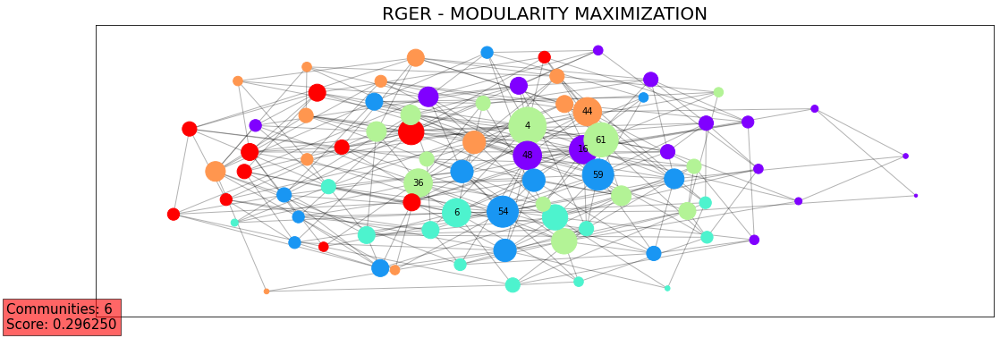

In [51]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("RGER - NEWMAN-GIRVAN (modularity)", RGER, nx.algorithms.community.modularity, 2, 2.5)
draw_newman_girvan("RGER - NEWMAN-GIRVAN (performance)", RGER, nx.algorithms.community.partition_quality, 2, 2.5)
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("RGER - SPECTRAL CLUSTERING (modularity)", RGER, nx.algorithms.community.modularity, 2, 2.5)
draw_spectral_clustering("RGER - SPECTRAL CLUSTERING (performance)", RGER, nx.algorithms.community.partition_quality, 2, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("RGER - MODULARITY MAXIMIZATION", RGER, 2, 2.5)

### Οπτικοποίηση κοινοτήτων RGG

49it [00:07,  6.36it/s]


Communities:  5 , Metric Score:  0.48454878826530606


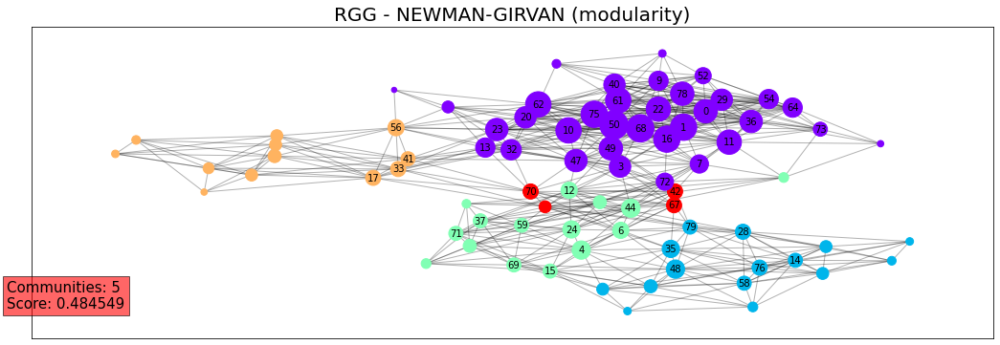

49it [00:03, 13.08it/s]


Communities:  26 , Metric Score:  0.9031645569620254


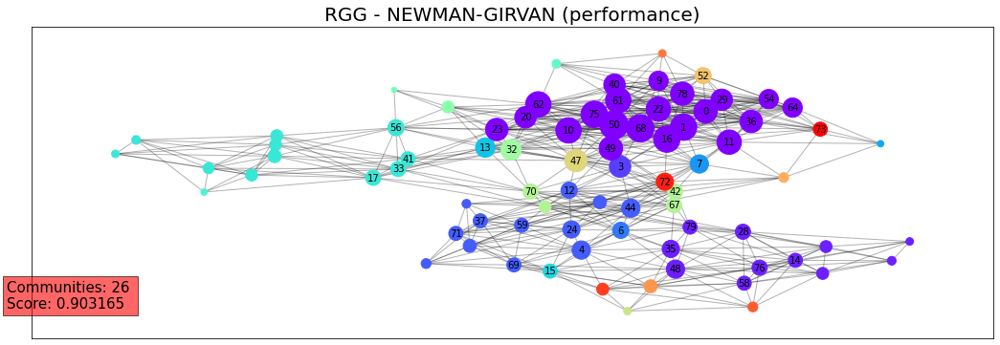

100%|██████████| 49/49 [00:01<00:00, 48.51it/s]


Communities:  4 , Metric Score:  0.5057110969387755


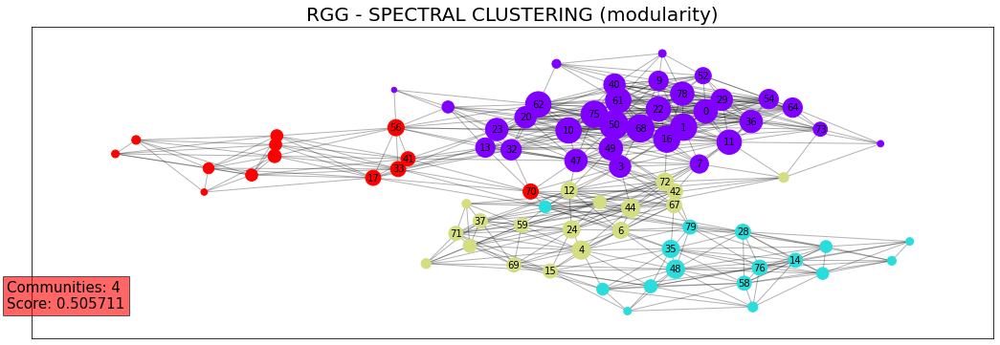

100%|██████████| 49/49 [00:00<00:00, 66.09it/s]


Communities:  7 , Metric Score:  0.8816455696202532


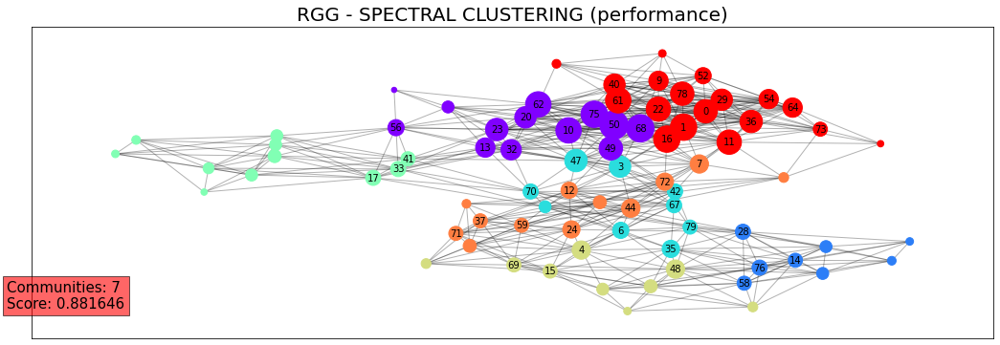

Communities:  3 , Metric Score:  0.4387181122448979


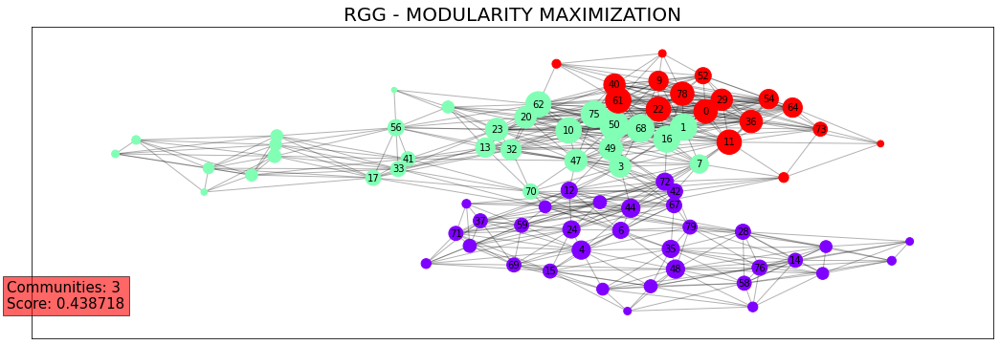

In [52]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("RGG - NEWMAN-GIRVAN (modularity)", RGG, nx.algorithms.community.modularity, 2.5, 1.8)
draw_newman_girvan("RGG - NEWMAN-GIRVAN (performance)", RGG, nx.algorithms.community.partition_quality, 2.5, 1.8)
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("RGG - SPECTRAL CLUSTERING (modularity)", RGG, nx.algorithms.community.modularity, 2.5, 1.8)
draw_spectral_clustering("RGG - SPECTRAL CLUSTERING (performance)", RGG, nx.algorithms.community.partition_quality, 2.5, 1.8)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("RGG - MODULARITY MAXIMIZATION", RGG, 2.5, 1.8)

### Οπτικοποίηση κοινοτήτων SF

49it [00:02, 18.38it/s]


Communities:  25 , Metric Score:  0.1305131146121883


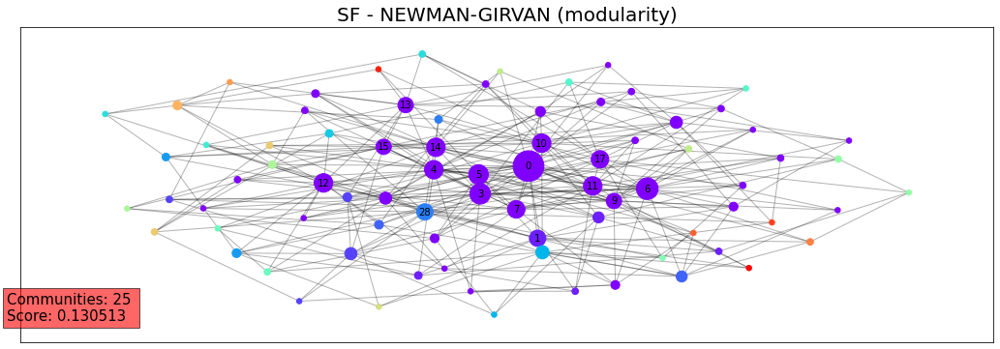

49it [00:02, 17.82it/s]


Communities:  49 , Metric Score:  0.915506329113924


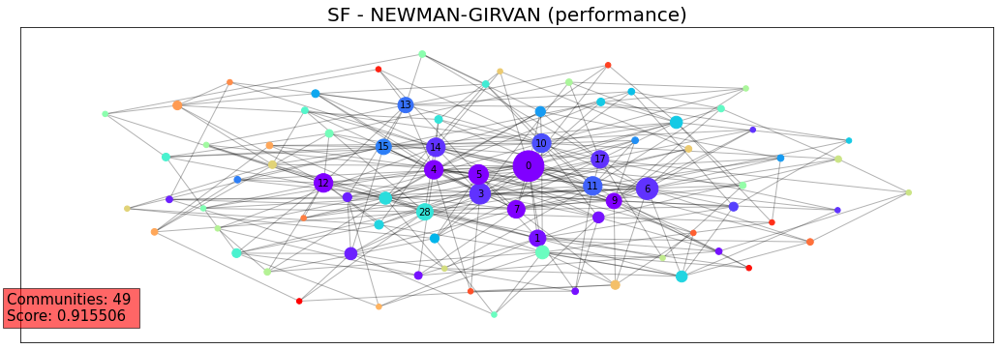

100%|██████████| 49/49 [00:00<00:00, 63.94it/s]


Communities:  5 , Metric Score:  0.22307825484764546


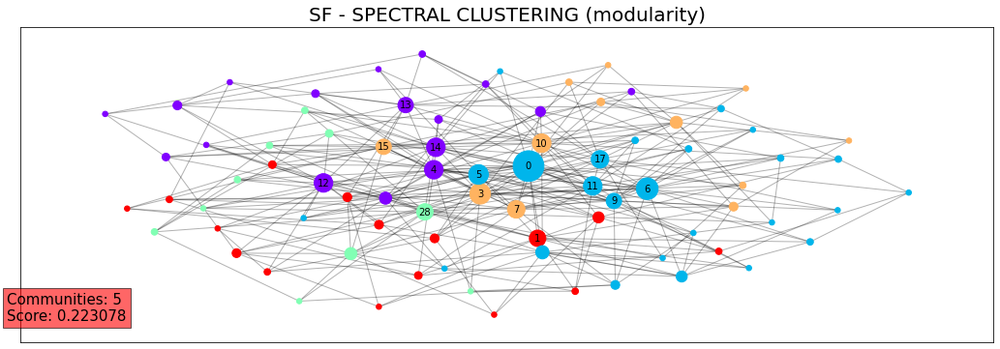

100%|██████████| 49/49 [00:00<00:00, 66.38it/s]


Communities:  30 , Metric Score:  0.8996835443037975


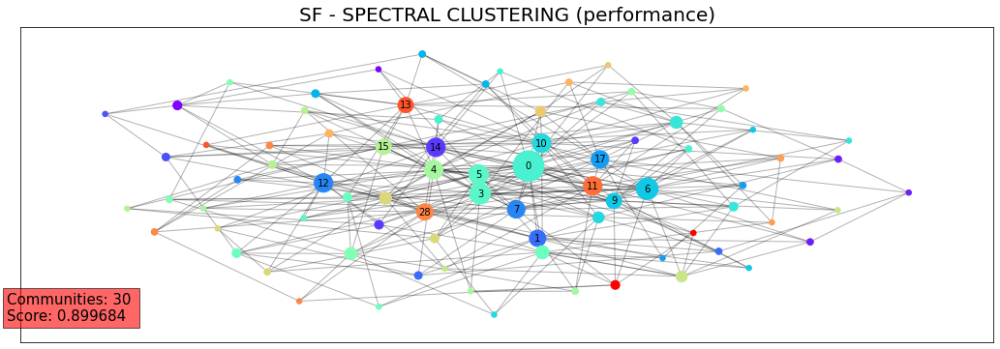

Communities:  7 , Metric Score:  0.26313084314404434


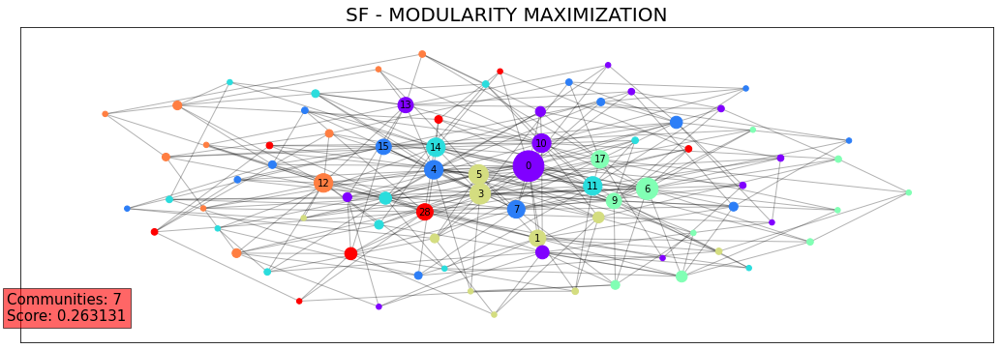

In [53]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("SF - NEWMAN-GIRVAN (modularity)", SF, nx.algorithms.community.modularity, 2.5, 1.8)
draw_newman_girvan("SF - NEWMAN-GIRVAN (performance)", SF, nx.algorithms.community.partition_quality, 2.5, 1.8)
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("SF - SPECTRAL CLUSTERING (modularity)", SF, nx.algorithms.community.modularity, 2.5, 1.8)
draw_spectral_clustering("SF - SPECTRAL CLUSTERING (performance)", SF, nx.algorithms.community.partition_quality, 2.5, 1.8)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("SF - MODULARITY MAXIMIZATION", SF, 2.5, 1.8)

### Οπτικοποίηση κοινοτήτων SW

49it [00:00, 72.03it/s] 


Communities:  8 , Metric Score:  0.5790039062500001


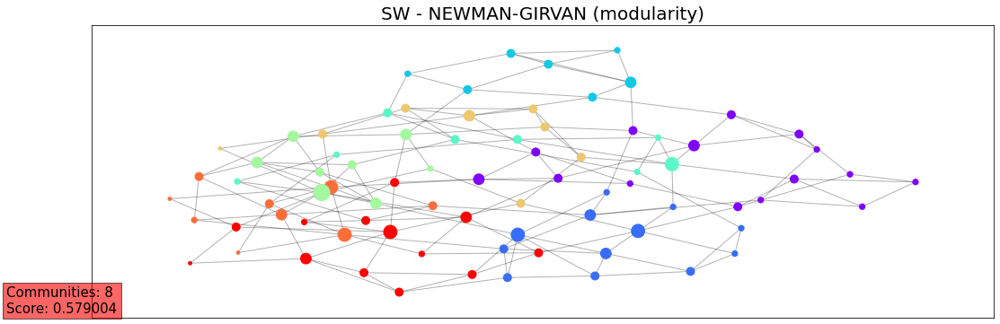

49it [00:00, 69.51it/s]


Communities:  31 , Metric Score:  0.9686708860759494


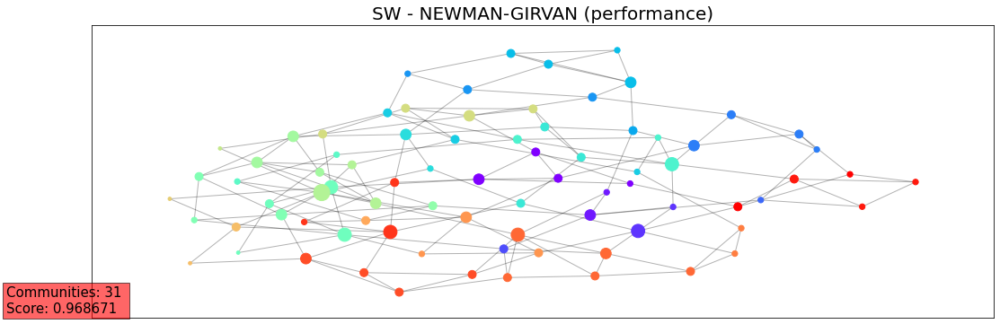

100%|██████████| 49/49 [00:00<00:00, 62.98it/s]


Communities:  11 , Metric Score:  0.5173632812500001


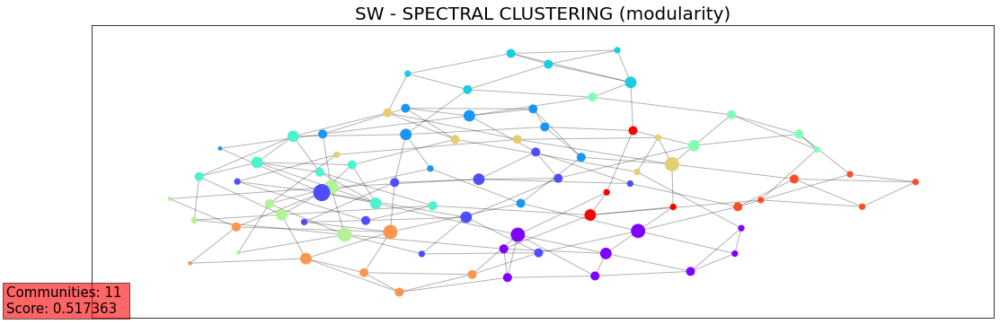

100%|██████████| 49/49 [00:00<00:00, 69.00it/s]


Communities:  32 , Metric Score:  0.9484177215189873


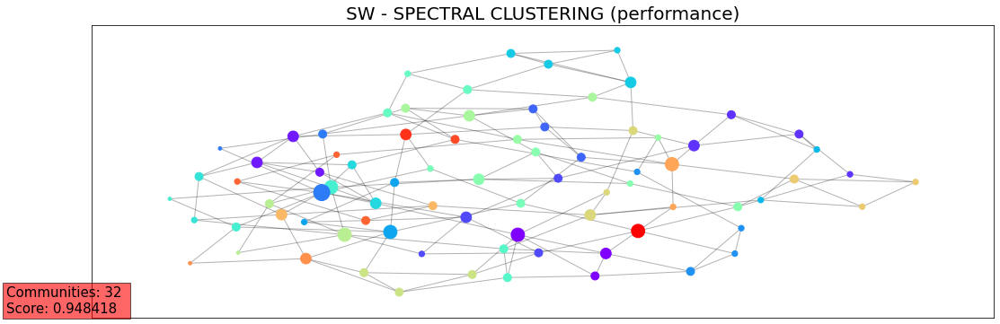

Communities:  8 , Metric Score:  0.569375


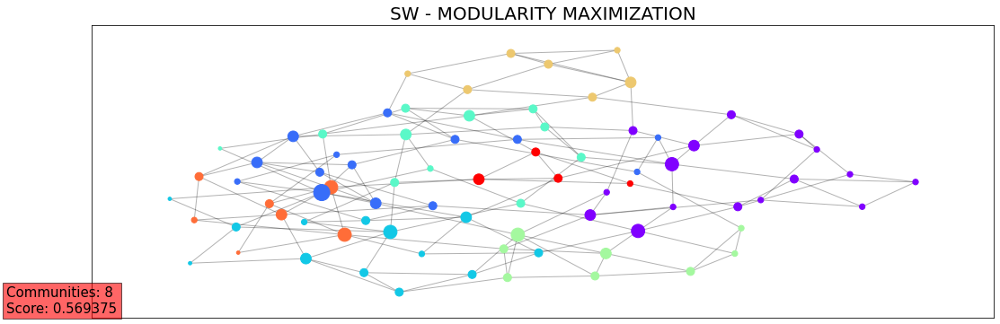

In [54]:
# NEWMAN-GIRVAN (modularity, performance)
draw_newman_girvan("SW - NEWMAN-GIRVAN (modularity)", SW, nx.algorithms.community.modularity, 2.5, 2.5)
draw_newman_girvan("SW - NEWMAN-GIRVAN (performance)", SW, nx.algorithms.community.partition_quality, 2.5, 2.5)
# SPECTRAL CLUSTERING (modularity, performance)
draw_spectral_clustering("SW - SPECTRAL CLUSTERING (modularity)", SW, nx.algorithms.community.modularity, 2.5, 2.5)
draw_spectral_clustering("SW - SPECTRAL CLUSTERING (performance)", SW, nx.algorithms.community.partition_quality, 2.5, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("SW - MODULARITY MAXIMIZATION", SW, 2.5, 2.5)

### ΣΧΟΛΙΑΣΜΟΣ
---
<center>

**Results for real networks - 3 Methods** <br>
(results are expressed in format **'communities (mod) | modularity | performance | time'**)

| Methods | FOOTBALL | GOT | EU |
| --- | :--- | :--- | :--- |
| Girvan-Newman | 10 \| 0.6 \| 0.95 \| 6s | 8 \| 0.66 \| 0.96 \| 2s | 2 \| 0.0006 \| 0.139 \| 10min |
| Spectral Clustering | 9 \| 0.57 \| 0.94 \| 1s | 7 \| 0.58 \| 0.94 \| 1s | 8 \| 0.38 \| 0.95 \| 15s |
| Modularity Maximization | 6 \| 0.55 \| 0.86 \| 1s | 5 \| 0.66 \| 0.82 \| 0s | 8 \| 0.34 \| 0.7 \| 5s |


</center>

1. **Σχολιασμός των 3 αλγορίθμων** <br>
Από άποψη ταχύτητας είναι σαφές ότι ο Modularity Maximization είναι ο πιο γρήγορος από τους 3, με τον Girvan-newman να είναι αργός κατά πολύ όταν έχουμε να κάνουμε με μεγάλους γράφους.
Παρατηρούμε ότι ο Newman-girvan συνηθίζει να παράγει περισσότερες κοινότητες, προσπαθώντας να βελτιστοποιήσει το modularity. Επίσης, όσον αφορά το score του modularity, πετυχαίνει μεγαλύτερο score σε σχέση με το Spectral Clustering, ενώ σε σχέση με το Modularity Maximization πετυχαίνει μεν μεγαλύτερο σκορ αλλά όχι πάντα με τόσο μεγάλη απόκλιση. Στη περίπτωση λοιπόν που μας νοιάζει η ταχύτητα ή η μεγάλη πληθυκότητα των κόμβων θα ήταν καλύτερο να επιλέξουμε έναν εκ των Spectral Clustering ή Modularity Maximization, με τον τελευταίο να αποδίδει καλύτερα για τη μετρική modularity. Στη περίπτωση του EU βλέπουμε ότι οι παρατηρήσεις αυτές ανατρέπονται καθώς ο Spectral Clustering φαίνεται να παράγει τα καλύτερα αποτελέσματα σε modularity και performance (αυτό όμως οφείλεται μάλλον στη ποιότητα του γράφου και όχι στο μέγεθός του).

2. **Σχολιασμός των συνθετικών δικτύων**
Το μεγαλύτερο βαθμό modularity φαίνεται να παρουσιάζουν οι γράφοι RGG και SW (εκτός του REG που είναι ομοιογενής και παρουσιάζει παντα μεγάλο modularity). Αυτό ευθύνεται κυρίως γιατί από τον ορισμό τους οι δύο γράφοι αυτοί περιέχουν κόμβους που συνδέονται με αρκετούς γείτονες και άρα πληρούν τα κριτήρια για μια μεγαλύτερη μετρική ομαδοποίησης. Ο RGER λόγω της τυχαιότητάς του έχει το μικρότερο σκορ. Ο SF περιμένουμε να έχει κάποια μερική ομαδοποίηση λόγω των κεντρικών κόμβων οι οποίοι δημιουργούν μικρές κοινότητες γύρω τους. Ωστόσο επειδή αυτό δεν ισχύει για όλους του κόμβους αυτής της τοπολογίας το modularity της είναι σχετικά μικρότερο από αυτό των RGG και SW.